# Análisis Gráfico del Consumo de Carne Mundial por País

En este análisis visualizaremos el consumo de carne per cápita por país, utilizando tanto **Python** como **R** para mostrar diferentes formas de trabajar con los datos y generar gráficos.

Haré especial hincapié en el vacuno ya que es el sector en el que trabajo.

---

## Carga y Datos

Utilizaremos tres datasets principales:

- **Consumption of meat per capita:** consumo anual de diferentes tipos de carne por país.
- **GDP per capita PPP:** Producto Interior Bruto per cápita ajustado por Paridad de Poder Adquisitivo.
- **owid_co2_data:** Emisiones de CO2 por país.

Haremos visualizaciones con los 3 datasets para ver relaciones y patrones en diferentes países.
    

In [21]:
# Instalación de dependencias para Python y R (ejecutar en terminal o en celda con ! para Python)

!pip install rpy2 country_converter pycountry_convert geopandas plotly seaborn ipywidgets

# En R, ejecutar esto en consola R o en celda mágica %%R
'''
install.packages(c("tidyverse", "plotly", "shiny", "readr", "curl", "httr", "treemapify"), repos="https://cloud.r-project.org/")
'''

!pip install rpy2

%load_ext rpy2.ipython



/home/domin/ntic_master/venv/lib/python3.10/site-packages/rpy2/rinterface/__init__.py:1211: UserWarning:

Environment variable "PWD" redefined by R and overriding existing variable. Current: "/mnt/c/Users/Propietario/AppData/Local/Programs/Microsoft VS Code", R: "/home/domin/ntic_master/visualizacion_avanzada/tarea"

/home/domin/ntic_master/venv/lib/python3.10/site-packages/rpy2/rinterface/__init__.py:1211: UserWarning:

Environment variable "LD_LIBRARY_PATH" redefined by R and overriding existing variable. Current: "/usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server", R: "/usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server:/usr/lib/R/lib:/usr/lib/x86_64-linux-gnu:/usr/lib/jvm/default-java/lib/server"

/home/domin/ntic_master/venv/lib/python3.10/site-packages/rpy2/rinterface/__init__.py:1211: UserWarning:

Environment variable "R_PAPERSIZE_USER" redefined by R and overriding existing variable. Current: "a4", R: "letter"

/home/domin/

In [3]:
# Importación de librerías y funciones
import os
import json
import pandas as pd
import numpy as np
import geopandas as gpd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import pycountry_convert as pc
import country_converter as coco
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import ipywidgets as widgets
from scipy.stats import pearsonr

# Función para convertir país a continente
def country_to_continent(country_name):
    try:
        code = pc.country_name_to_country_alpha2(country_name)
        continent_code = pc.country_alpha2_to_continent_code(code)
        return pc.convert_continent_code_to_continent_name(continent_code)
    except:
        return None


In [5]:
# Carga shapefile (mapa) con geopandas
shapefile_dir = "./ne_countries"
shapefile_path = next((os.path.join(shapefile_dir, f) for f in os.listdir(shapefile_dir) if f.endswith(".shp")), None)
world = gpd.read_file(shapefile_path)

# Corrige códigos ISO3 si es necesario
correcciones_iso = {
    'France': 'FRA',
    'Norway': 'NOR',
}
for pais, iso3 in correcciones_iso.items():
    world.loc[world['ADMIN'] == pais, 'ISO_A3'] = iso3


In [7]:
# Cargar y preparar datos de consumo de carne 2020
csv_meat_path = "./Consumption_of_meat_per_capita.csv"
meat_df = pd.read_csv(csv_meat_path)
meat_2020 = meat_df[meat_df['Year'] == 2020].copy()
meat_2020['Continent'] = meat_2020['Entity'].apply(country_to_continent)

replace_dict = {"United States": "United States of America"}
meat_2020['Entity'] = meat_2020['Entity'].replace(replace_dict)
meat_2020['ISO3'] = coco.convert(names=meat_2020['Entity'], to='ISO3')

features = ['Poultry', 'Beef', 'Sheep and goat', 'Pork', 'Other meats']
meat_2020['Total_meat'] = meat_2020[features].sum(axis=1)


North America not found in regex
World not found in regex


In [8]:
# Cargar GDP y merge con datos de carne
csv_gdp_path = "./GDP_per_capita_PPP.csv"
gdp_df = pd.read_csv(csv_gdp_path)
gdp_2020 = gdp_df[gdp_df['Year'] == 2020][['Entity', 'GDP per capita, PPP (constant 2017 international $)']].copy()
gdp_2020['Entity'] = gdp_2020['Entity'].replace(replace_dict)
meat_gdp_2020 = pd.merge(meat_2020, gdp_2020, on='Entity', how='left')


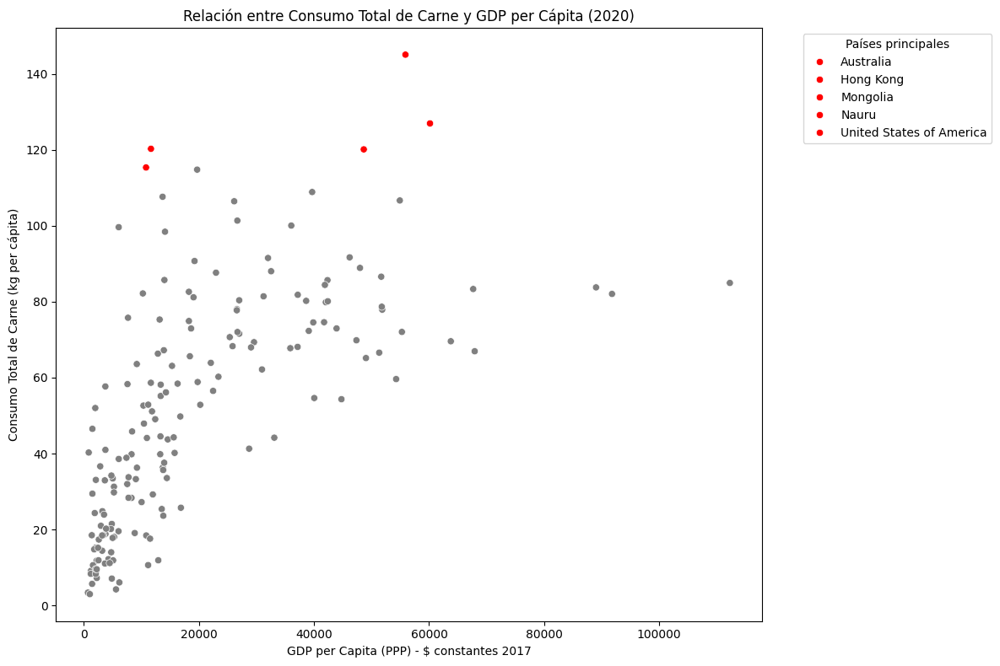

In [9]:
# Scatterplot PIB per cápita vs Consumo total carne 2020
top_countries = meat_gdp_2020.sort_values('Total_meat', ascending=False)['Entity'].unique()[:5]
plt.figure(figsize=(12,8))
sns.scatterplot(
    data=meat_gdp_2020,
    x='GDP per capita, PPP (constant 2017 international $)',
    y='Total_meat',
    hue='Entity',
    palette={c: 'red' if c in top_countries else 'grey' for c in meat_gdp_2020['Entity'].unique()},
    legend='full'
)
handles, labels = plt.gca().get_legend_handles_labels()
filtered = [(h, l) for h, l in zip(handles, labels) if l in top_countries]
if filtered:
    handles, labels = zip(*filtered)
    plt.legend(handles, labels, title='Países principales', bbox_to_anchor=(1.05, 1), loc=2)
else:
    plt.legend([], [], frameon=False)
plt.title('Relación entre Consumo Total de Carne y GDP per Cápita (2020)')
plt.xlabel('GDP per Capita (PPP) - $ constantes 2017')
plt.ylabel('Consumo Total de Carne (kg per cápita)')
plt.tight_layout()
plt.show()


In [10]:
# Correlaciones lineal y log-log entre PIB y consumo de carne
df_corr = meat_gdp_2020[['GDP per capita, PPP (constant 2017 international $)', 'Total_meat']].dropna()
corr_linear, _ = pearsonr(df_corr.iloc[:,0], df_corr.iloc[:,1])
print(f"Correlación lineal (PIB per cápita vs Consumo de carne): {corr_linear:.2f}")

df_corr_log = np.log10(df_corr[df_corr > 0])
corr_log, _ = pearsonr(df_corr_log.iloc[:,0], df_corr_log.iloc[:,1])
print(f"Correlación log-log (log10 GDP vs log10 carne): {corr_log:.2f}")


Correlación lineal (PIB per cápita vs Consumo de carne): 0.65
Correlación log-log (log10 GDP vs log10 carne): 0.77


In [11]:
# Correlaciones lineal y log-log entre PIB y consumo de carne
df_corr = meat_gdp_2020[['GDP per capita, PPP (constant 2017 international $)', 'Total_meat']].dropna()
corr_linear, _ = pearsonr(df_corr.iloc[:,0], df_corr.iloc[:,1])
print(f"Correlación lineal (PIB per cápita vs Consumo de carne): {corr_linear:.2f}")

df_corr_log = np.log10(df_corr[df_corr > 0])
corr_log, _ = pearsonr(df_corr_log.iloc[:,0], df_corr_log.iloc[:,1])
print(f"Correlación log-log (log10 GDP vs log10 carne): {corr_log:.2f}")


Correlación lineal (PIB per cápita vs Consumo de carne): 0.65
Correlación log-log (log10 GDP vs log10 carne): 0.77


### La correlación lineal directa entre el PIB per cápita y el consumo de carne es moderada-alta (0.65), lo que indica que a mayor desarrollo económico, mayor es el consumo de carne.

### Al aplicar una transformación logarítmica a ambas variables (log-log), la correlación aumenta a 0.77, lo que sugiere que la relación es más consistente y estable cuando se modela de forma proporcional (es decir, un aumento porcentual en PIB se asocia a un aumento porcentual en consumo de carne).

In [ ]:
# Visualizaciones interactivas con ipywidgets: evolución consumo por país
features = ['Poultry', 'Beef', 'Sheep and goat', 'Pork', 'Other meats', 'Fish and seafood']

meat_long = meat_df.melt(
    id_vars=["Entity", "Year"],
    value_vars=features,
    var_name="Meat_Type",
    value_name="Consumption"
)

meat_colors = {
    'Poultry': '#E69F00',
    'Beef': '#D55E00',
    'Sheep and goat': '#009E73',
    'Pork': '#0072B2',
    'Other meats': '#CC79A7',
    'Fish and seafood': '#56B4E9'
}

@widgets.interact
def plot_meat_consumption_country(country=widgets.Dropdown(options=sorted(meat_df["Entity"].unique()), value="Spain", description='País:')):
    data = meat_long[meat_long["Entity"] == country]
    plt.figure(figsize=(12,6))
    sns.lineplot(data=data, x="Year", y="Consumption", hue="Meat_Type", marker="o", palette=meat_colors)
    plt.title(f"Evolución del Consumo de Carne en {country}")
    plt.xlabel("Año")
    plt.ylabel("Consumo (kg per cápita)")
    plt.legend(title="Tipo de carne")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


interactive(children=(Dropdown(description='País:', index=162, options=('Afghanistan', 'Albania', 'Algeria', '…

In [32]:
# Visualización evolución promedio por continente
meat_continent_df = meat_df.copy()
if 'Continent' not in meat_continent_df.columns:
    meat_continent_df['Continent'] = meat_continent_df['Entity'].apply(country_to_continent)

meat_long_cont = meat_continent_df.melt(
    id_vars=["Entity", "Year", "Continent"],
    value_vars=features,
    var_name="Meat_Type",
    value_name="Consumption"
)

@widgets.interact
def plot_meat_consumption_continent(continent=widgets.Dropdown(options=sorted(meat_long_cont['Continent'].dropna().unique()), value='Europe', description='Continente:')):
    data = meat_long_cont[meat_long_cont["Continent"] == continent]
    data_grouped = data.groupby(['Year', 'Meat_Type']).Consumption.mean().reset_index()
    plt.figure(figsize=(12,6))
    sns.lineplot(data=data_grouped, x="Year", y="Consumption", hue="Meat_Type", marker="o", palette=meat_colors)
    plt.title(f"Evolución del Consumo Promedio de Carne en {continent}")
    plt.xlabel("Año")
    plt.ylabel("Consumo Promedio (kg per cápita)")
    plt.legend(title="Tipo de carne")
    plt.grid(True)
    plt.tight_layout()
    plt.show()


interactive(children=(Dropdown(description='Continente:', index=2, options=('Africa', 'Asia', 'Europe', 'North…

In [33]:
# Clustering de países según consumo de carne 2020
meat_2020_clean = meat_gdp_2020.dropna(subset=features).copy()
X_scaled = StandardScaler().fit_transform(meat_2020_clean[features])

kmeans = KMeans(n_clusters=4, random_state=42)
meat_2020_clean['Cluster_num'] = kmeans.fit_predict(X_scaled)

cluster_means = meat_2020_clean.groupby('Cluster_num')[features].mean()
print("\nMedias por clúster:")
print(cluster_means)

for i, row in cluster_means.iterrows():
    print(f"\nCluster {i}")
    print(row.sort_values(ascending=False))

cluster_labels = {
    0: "Alto consumo de Pollo y Pescado",
    1: "Consumo moderado/bajo",
    2: "Alto consumo general (Cerdo y Pollo)",
    3: "Alto consumo de Otras carnes"
}
meat_2020_clean['Cluster'] = meat_2020_clean['Cluster_num'].map(cluster_labels)



Medias por clúster:
               Poultry       Beef  Sheep and goat       Pork  Other meats  \
Cluster_num                                                                 
0            51.025369  10.892609        4.398351   9.821466     1.108031   
1            11.256704   8.006387        3.312901   3.902404     1.263042   
2            28.132311  16.558735        1.824323  32.010205     0.847951   
3             3.130000   0.900000        1.360000   9.119999    43.169990   

             Fish and seafood  
Cluster_num                    
0                   34.804115  
1                   11.477326  
2                   23.446915  
3                   13.409998  

Cluster 0
Poultry             51.025369
Fish and seafood    34.804115
Beef                10.892609
Pork                 9.821466
Sheep and goat       4.398351
Other meats          1.108031
Name: 0, dtype: float64

Cluster 1
Fish and seafood    11.477326
Poultry             11.256704
Beef                 8.006387
Pork    

In [34]:
# Merge con GeoDataFrame para mapa y preparar geojson
merged = world.merge(meat_2020_clean, left_on='ISO_A3', right_on='ISO3', how='left')
merged = merged.reset_index()
merged['id'] = merged['index'].astype(str)

geojson = json.loads(merged.to_json())
for feature, idx in zip(geojson['features'], merged['id']):
    feature['id'] = idx


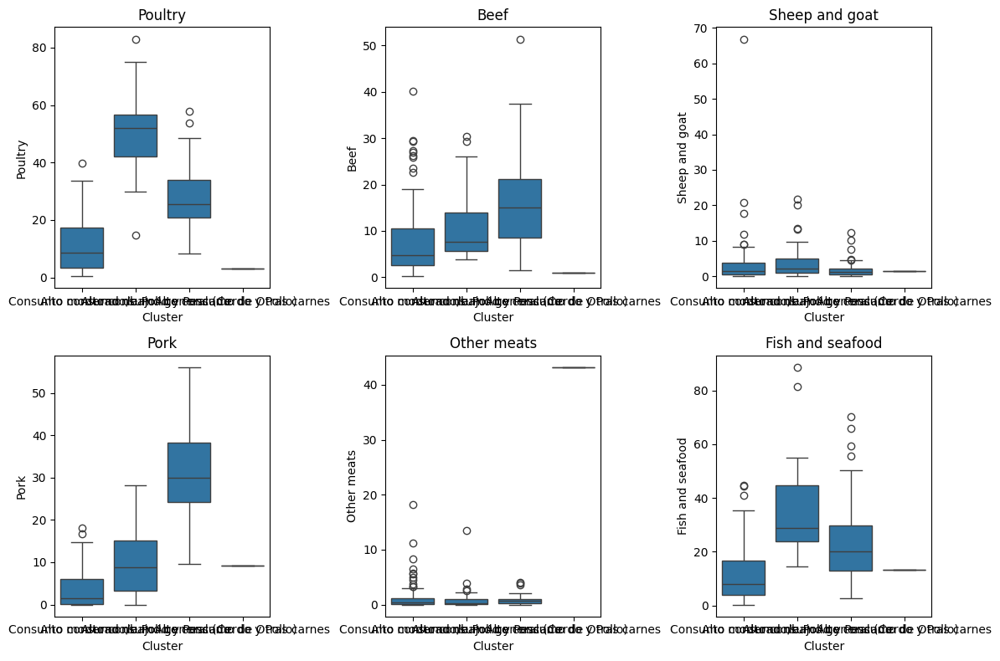

In [35]:
# Boxplots por tipo de carne y clúster
plt.figure(figsize=(12,8))
for i, meat_type in enumerate(features):
    plt.subplot(2,3,i+1)
    sns.boxplot(x='Cluster', y=meat_type, data=meat_2020_clean)
    plt.title(meat_type)
plt.tight_layout()
plt.show()


In [36]:
# Mapa interactivo con Plotly de clusters
fig_clusters = px.choropleth(
    merged,
    geojson=geojson,
    locations='id',
    color='Cluster',
    hover_name='Entity',
    color_discrete_sequence=px.colors.qualitative.Set2,
    labels={'Cluster': 'Cluster de Consumo'},
    title='Segmentación de Países según Consumo de Carne (2020)'
)
fig_clusters.update_geos(fitbounds="locations", visible=False)
fig_clusters.show()


## 🟢 Cluster 0: Alto consumo de Pollo y Pescado

- Predomina el **pollo (~51 kg per cápita)** y el **pescado (~35 kg)**.
- Vacuno y cerdo con valores moderados.
- Indica una preferencia clara por carnes más ligeras o blancas.

---

## 🟡 Cluster 1: Consumo moderado/bajo

- **Consumo bajo o moderado en todas las carnes**.
- Pollo (~11 kg), pescado (~11 kg), vacuno (~8 kg), cerdo (~4 kg).
- Representa países con dietas menos centradas en carne o con menor poder adquisitivo.

---

## 🔵 Cluster 2: Alto consumo general (Cerdo y Pollo)

- **Cerdo (~32 kg)**, **pollo (~28 kg)** y **pescado (~23 kg)** en niveles altos.
- También vacuno (~16 kg), lo que indica un consumo muy amplio y equilibrado.
- Refleja dietas cárnicas intensivas y variadas.

---

## 🔴 Cluster 3: Alto consumo de Otras carnes

- **Altísimo consumo de "otras carnes" (~43 kg)**.
- Pollo, vacuno y cordero con valores muy bajos.
- Probablemente refleja dietas locales no basadas en carnes tradicionales.


In [37]:
# Mapa consumo total carne per cápita (2020)
fig_total_meat = px.choropleth(
    merged,
    geojson=geojson,
    locations='id',
    color='Total_meat',
    hover_name='Entity',
    color_continuous_scale='YlOrRd',
    labels={'Total_meat': 'Consumo carne (kg per cápita)'},
    title='Consumo Total de Carne per cápita por País (2020)',
    featureidkey='id'
)
fig_total_meat.update_geos(fitbounds="locations", visible=False)
fig_total_meat.show()


### Al analizar la evolucion de consumo promedio en europa podemos ver varios puntos interesantes:
### - En el año 1990 baja el consumo de carne porcina. En la ganadería porcina, brotes de enfermedades como la peste porcina africana o la peste porcina clásica pueden reducir la producción y, por ende, el consumo. También, miedo de los consumidores ante estas enfermedades puede reducir la demanda. Esta es la causistica de ese año en Europa.
### - Tambien podemos ver como ha descendido el consumo de carne de vacuno y ha aumentado el consumo de carne de ave, debido en parte a la industrializacion de la industria aviar y el abaratamiento del producto.
### - En africa las carnes mas consumidas son ave y vacuno, aunque ultimemente la carne de ave esta siendo mas consumida que la carne de vacuno, en america del sur la situacion es similar pero consumiendo mas cerdo.

## ¿Qué pasó en 2009 en Zimbabue?
 1. Cambio de moneda y fin de la hiperinflación
Entre 2007 y 2008, Zimbabue sufrió una de las hiperinflaciones más extremas del mundo, con tasas de más de 79.000.000.000 %.

En 2009, el país abandonó oficialmente el dólar zimbabuense y empezó a usar monedas extranjeras como el dólar estadounidense y el rand sudafricano, estabilizando la economía.

Esta recuperación monetaria permitió mejor acceso a mercados y productos, incluyendo la carne.

 2. Política de "resettlement" y producción ganadera
En los años previos (2000-2008), el gobierno implementó la Reforma Agraria Rápida, redistribuyendo tierras agrícolas de propietarios blancos a población negra.

Aunque inicialmente eso causó caos y caída de producción, para 2009 empezaron a estabilizarse muchas explotaciones, especialmente en ganadería de subsistencia y cooperativas locales.

Esto provocó una mayor disponibilidad de carne vacuno en el mercado local.

## El caso de los paises eslavos 

En muchas zonas rurales de Europa del Este, la cría de cerdos es más accesible que la de vacas u ovejas, ya que requieren menos espacio y pastos.

Los cerdos pueden alimentarse con residuos de cocina y subproductos agrícolas, algo muy aprovechado en economías más tradicionales.

Históricamente, la carne de cerdo ha sido más barata de producir y adquirir que la de vacuno u ovino.

Durante la época comunista, muchos países del bloque soviético fomentaron la producción porcina por su eficiencia alimentaria. 

In [ ]:
%%R

# Código R para gráfico interactivo Shiny del consumo de vacuno

library(tidyverse)
library(plotly)
library(readr)
library(dplyr)
library(ggplot2)
library(treemapify)
library(shiny)

csv_meat_path <- "./Consumption_of_meat_per_capita.csv"
meat_df <- read_csv(csv_meat_path)

beef_2020 <- meat_df %>%
  filter(Year == 2020) %>%
  select(Entity, Beef) %>%
  arrange(desc(Beef)) %>%
  drop_na()

ui <- fluidPage(
  titlePanel("Consumo de Carne de Vacuno per Cápita (2020)"),
  sidebarLayout(
    sidebarPanel(
      sliderInput("top_n", "Número de países a mostrar:",
                  min = 5, max = 50, value = 20, step = 1)
    ),
    mainPanel(
      plotlyOutput("beef_plot")
    )
  )
)

server <- function(input, output) {
  output$beef_plot <- renderPlotly({
    top_data <- beef_2020 %>% slice_max(Beef, n = input$top_n)
    p <- ggplot(top_data, aes(x = reorder(Entity, Beef), y = Beef)) +
      geom_col(fill = "darkred") +
      coord_flip() +
      labs(x = "País", y = "Consumo de vacuno (kg per cápita)",
           title = paste("Top", input$top_n, "países con mayor consumo de vacuno en 2020")) +
      theme_minimal()
    ggplotly(p)
  })
}

shinyApp(ui, server)


Rows: 10080 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): Entity
dbl (7): Year, Poultry, Beef, Sheep and goat, Pork, Other meats, Fish and se...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


/usr/bin/xdg-open: 882: x-www-browser: not found
/usr/bin/xdg-open: 882: firefox: not found
/usr/bin/xdg-open: 882: iceweasel: not found
/usr/bin/xdg-open: 882: seamonkey: not found
/usr/bin/xdg-open: 882: mozilla: not found
/usr/bin/xdg-open: 882: epiphany: not found
/usr/bin/xdg-open: 882: konqueror: not found
/usr/bin/xdg-open: 882: chromium: not found
/usr/bin/xdg-open: 882: chromium-browser: not found
/usr/bin/xdg-open: 882: google-chrome: not found
/usr/bin/xdg-open: 882: www-browser: not found



Listening on http://127.0.0.1:6887




/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found


RRuntimeError: object 'plotly_html' not found

/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening 'http://127.0.0.1:6887'


Columnas del dataset CO2:
['country', 'year', 'iso_code', 'population', 'gdp', 'cement_co2', 'cement_co2_per_capita', 'co2', 'co2_growth_abs', 'co2_growth_prct', 'co2_including_luc', 'co2_including_luc_growth_abs', 'co2_including_luc_growth_prct', 'co2_including_luc_per_capita', 'co2_including_luc_per_gdp', 'co2_including_luc_per_unit_energy', 'co2_per_capita', 'co2_per_gdp', 'co2_per_unit_energy', 'coal_co2', 'coal_co2_per_capita', 'consumption_co2', 'consumption_co2_per_capita', 'consumption_co2_per_gdp', 'cumulative_cement_co2', 'cumulative_co2', 'cumulative_co2_including_luc', 'cumulative_coal_co2', 'cumulative_flaring_co2', 'cumulative_gas_co2', 'cumulative_luc_co2', 'cumulative_oil_co2', 'cumulative_other_co2', 'energy_per_capita', 'energy_per_gdp', 'flaring_co2', 'flaring_co2_per_capita', 'gas_co2', 'gas_co2_per_capita', 'ghg_excluding_lucf_per_capita', 'ghg_per_capita', 'land_use_change_co2', 'land_use_change_co2_per_capita', 'methane', 'methane_per_capita', 'nitrous_oxide', 'n

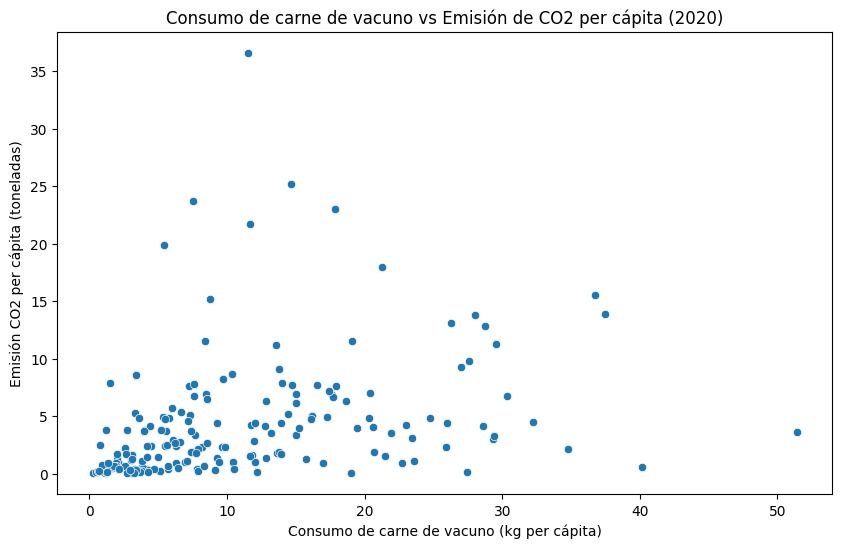

Correlación entre consumo de vacuno y emisiones de CO2 per cápita en 2020: 0.32


In [ ]:
# Análisis adicional con datos de emisiones CO2 y consumo de vacuno (Python)

co2_path = "./owid_co2_data.csv"
co2_df = pd.read_csv(co2_path)

print("Columnas del dataset CO2:")
print(co2_df.columns.tolist())

print("\nPrimeras 10 filas del dataset CO2:")
print(co2_df.head(10))

co2_2020 = co2_df[co2_df['year'] == 2020][['country', 'co2_per_capita', 'co2']].copy()
co2_2020 = co2_2020.dropna()

meat_2020 = meat_df[meat_df['Year'] == 2020][['Entity', 'Beef']].copy()
meat_2020 = meat_2020.dropna()

merged_df = pd.merge(co2_2020, meat_2020, left_on='country', right_on='Entity')

plt.figure(figsize=(10,6))
sns.scatterplot(data=merged_df, x='Beef', y='co2_per_capita')
plt.title('Consumo de carne de vacuno vs Emisión de CO2 per cápita (2020)')
plt.xlabel('Consumo de carne de vacuno (kg per cápita)')
plt.ylabel('Emisión CO2 per cápita (toneladas)')
plt.show()

correlation = merged_df['Beef'].corr(merged_df['co2_per_capita'])
print(f"Correlación entre consumo de vacuno y emisiones de CO2 per cápita en 2020: {correlation:.2f}")


In [ ]:
%%R
# Treemap interactivo en R por continente y país (shiny)

library(shiny)
library(tidyverse)
library(treemapify)
library(countrycode)

csv_meat_path <- "./Consumption_of_meat_per_capita.csv"
meat_df <- read_csv(csv_meat_path)

meat_df <- meat_df %>%
  mutate(Continent = countrycode(sourcevar = Entity, origin = "country.name", destination = "continent"))

meat_2020 <- meat_df %>%
  filter(Year == 2020) %>%
  mutate(total_meat = Poultry + Beef + `Sheep and goat` + Pork + `Other meats` + `Fish and seafood`) %>%
  filter(!is.na(total_meat) & !is.na(Continent))

ui <- fluidPage(
  titlePanel("Treemap Interactivo Consumo de Carne por Continente y País (2020)"),
  sidebarLayout(
    sidebarPanel(
      selectInput("continent", "Selecciona un continente:",
                  choices = unique(meat_2020$Continent),
                  selected = unique(meat_2020$Continent)[1])
    ),
    mainPanel(
      plotOutput("treemap", height = "600px")
    )
  )
)

server <- function(input, output) {
  output$treemap <- renderPlot({
    data_filtrada <- meat_2020 %>% filter(Continent == input$continent)
    ggplot(data_filtrada, aes(area = total_meat, fill = total_meat, label = Entity)) +
      geom_treemap() +
      geom_treemap_text(colour = "white", place = "centre", grow = TRUE) +
      scale_fill_viridis_c(option = "plasma") +
      labs(title = paste("Consumo total de carne en", input$continent))
  })
}

shinyApp(ui, server)


Rows: 10080 Columns: 8
── Column specification ────────────────────────────────────────────────────────
Delimiter: ","
chr (1): Entity
dbl (7): Year, Poultry, Beef, Sheep and goat, Pork, Other meats, Fish and se...

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


/usr/bin/xdg-open: 882: x-www-browser: not found
/usr/bin/xdg-open: 882: firefox: not found
/usr/bin/xdg-open: 882: iceweasel: not found
/usr/bin/xdg-open: 882: seamonkey: not found
/usr/bin/xdg-open: 882: mozilla: not found
/usr/bin/xdg-open: 882: epiphany: not found
/usr/bin/xdg-open: 882: konqueror: not found
/usr/bin/xdg-open: 882: chromium: not found
/usr/bin/xdg-open: 882: chromium-browser: not found
/usr/bin/xdg-open: 882: google-chrome: not found
/usr/bin/xdg-open: 882: www-browser: not found
/usr/bin/xdg-open: 882: links2: not found
/usr/bin/xdg-open: 882: elinks: not found
/usr/bin/xdg-open: 882: links: not found
/usr/bin/xdg-open: 882: lynx: not found
/usr/bin/xdg-open: 882: w3m: not found
xdg-open: no method available for opening 'http://127.0.0.1:6887'



Listening on http://127.0.0.1:6887


In addition: Warning message:
There was 1 warning in `mutate()`.
ℹ In argument: `Continent = countrycode(sourcevar = Entity, origin =
  "country.name", destination = "continent")`.
Caused by warning:
! Some values were not matched unambiguously: Czechoslovakia, North America, Serbia and Montenegro, World, Yugoslavia 


RRuntimeError: object 'plotly_html' not found

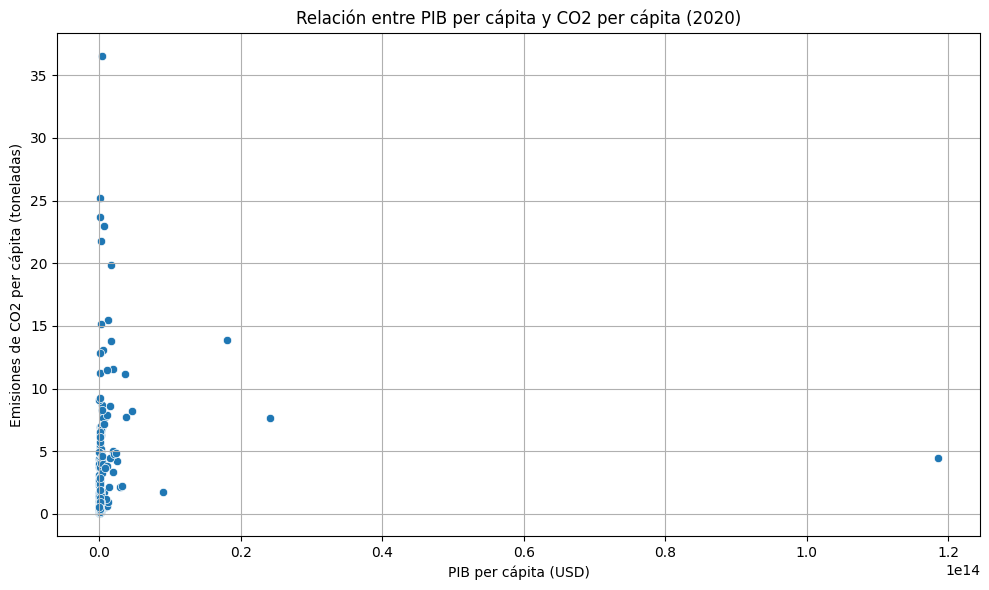

Correlación entre PIB per cápita y CO2 per cápita en 2020: 0.05
Correlación log-log entre PIB per cápita y CO₂ per cápita: 0.9


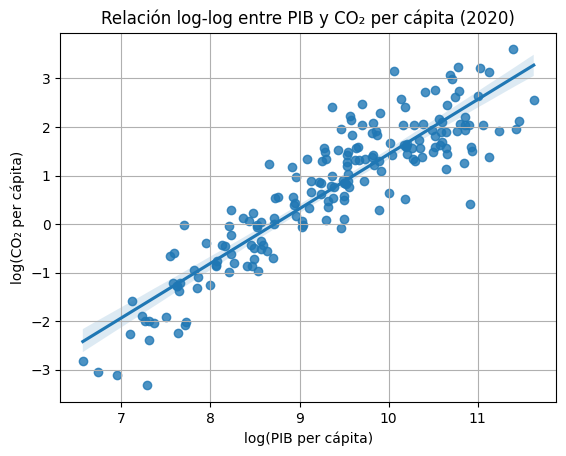

In [42]:
# Filtramos datos de 2020 con columnas relevantes
co2_gdp_2020 = co2_df[
    (co2_df['year'] == 2020) &
    (co2_df['gdp'].notna()) &
    (co2_df['co2_per_capita'].notna())
][['country', 'gdp', 'co2_per_capita']].copy()

# Renombramos para claridad
co2_gdp_2020.rename(columns={'country': 'Entity'}, inplace=True)

# Gráfico de dispersión
plt.figure(figsize=(10, 6))
sns.scatterplot(data=co2_gdp_2020, x='gdp', y='co2_per_capita')
plt.title('Relación entre PIB per cápita y CO2 per cápita (2020)')
plt.xlabel('PIB per cápita (USD)')
plt.ylabel('Emisiones de CO2 per cápita (toneladas)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Cálculo de correlación
correlation = co2_gdp_2020['gdp'].corr(co2_gdp_2020['co2_per_capita'])
print(f"Correlación entre PIB per cápita y CO2 per cápita en 2020: {correlation:.2f}")

# DataFrame con las dos columnas que necesitas
co2_gdp_2020 = pd.merge(
    co2_df[co2_df['year'] == 2020][['country', 'co2_per_capita']],
    gdp_df[gdp_df['Year'] == 2020][['Entity', 'GDP per capita, PPP (constant 2017 international $)']],
    left_on='country', right_on='Entity', how='inner'
)

# Renombra por comodidad
co2_gdp_2020 = co2_gdp_2020.rename(columns={
    'GDP per capita, PPP (constant 2017 international $)': 'gdp_per_capita'
})

# Elimina nulos
co2_gdp_2020 = co2_gdp_2020.dropna()

# Log-transform
co2_gdp_2020['log_gdp'] = np.log(co2_gdp_2020['gdp_per_capita'])
co2_gdp_2020['log_co2'] = np.log(co2_gdp_2020['co2_per_capita'])

# Correlación log-log
corr_log = co2_gdp_2020[['log_gdp', 'log_co2']].corr().iloc[0, 1]
print(f"Correlación log-log entre PIB per cápita y CO₂ per cápita: {round(corr_log, 2)}")

# Scatterplot
sns.regplot(data=co2_gdp_2020, x='log_gdp', y='log_co2')
plt.title('Relación log-log entre PIB y CO₂ per cápita (2020)')
plt.xlabel('log(PIB per cápita)')
plt.ylabel('log(CO₂ per cápita)')
plt.grid(True)
plt.show()


 A pesar de que el análisis directo de correlación lineal entre PIB per cápita y emisiones de CO₂ por habitante no mostró una relación significativa, al aplicar una transformación logarítmica a ambas variables la correlación aumenta hasta 0.9. Esto indica una fuerte asociación no lineal: los países con mayor desarrollo económico tienden a emitir más CO₂ per cápita, aunque con rendimientos decrecientes.
 Por lo tanto podemos llegar a la conclusion que el motivo por el que los paises desarrollados producen mas co2 es porque estan mas desarrollados y no porque consumen mas carne.
 El alto consumo de carne en países desarrollados es más bien una consecuencia del desarrollo, no su causa principal de emisiones. 

El consumo de carne de vacuno ha bajado en muchos países durante la última década por varios motivos interrelacionados:

Conciencia ambiental y cambio climático
La producción de carne de vacuno es una de las actividades ganaderas que genera más emisiones de gases de efecto invernadero (metano, CO2). Por eso, cada vez más gente reduce su consumo para minimizar su huella ambiental. Aunque como hemos visto en este estudio, eso no es del todo cierto, ya que existe una relacion directa pero leve.

Salud y bienestar
Campañas de salud pública y estudios científicos han vinculado el consumo excesivo de carne roja con riesgos para la salud, como enfermedades cardiovasculares y ciertos tipos de cáncer. Esto ha fomentado dietas más equilibradas o basadas en plantas.

Tendencias dietéticas
El auge de dietas vegetarianas, veganas o flexitarianas ha hecho que muchas personas reduzcan el consumo de carne roja, sustituyéndola por pollo, pescado, proteínas vegetales o alternativas vegetales.

Precio y economía
En algunos mercados, la carne de vacuno suele ser más cara que otras carnes (pollo, cerdo). Si los precios suben o hay crisis económicas, el consumo de vacuno puede caer más rápido.

Impacto de la producción y oferta
Problemas en la cadena de suministro, regulación ambiental o brotes de enfermedades en ganado (como la fiebre aftosa o la vaca loca en décadas anteriores) pueden influir en la oferta y la demanda.

Cultura y moda gastronómica
La popularización de platos y cocinas que usan más pollo o pescado, o la aparición de “superalimentos” y productos saludables, influye en las preferencias del consumidor.